# ___Les Données___

### Affichage et traitement des sommets et arêtes

In [1]:
from service.read_file import read_file_metro

sommets, aretes = read_file_metro("res/metro.txt")
print("Sommets : ")
for sommet in sommets:
    print(sommet)
print()

print("Arêtes : ")
for arete in aretes:
    print(arete)

Sommets : 
Sommet(Abbesses
	Stations :
	0 : ligne - 12, terminus - False, branchement - 0)
Sommet(Alexandre Dumas
	Stations :
	1 : ligne - 2, terminus - False, branchement - 0)
Sommet(Alma Marceau
	Stations :
	2 : ligne - 9, terminus - False, branchement - 0)
Sommet(Alésia
	Stations :
	3 : ligne - 4, terminus - False, branchement - 0)
Sommet(Anatole France
	Stations :
	4 : ligne - 3, terminus - False, branchement - 0)
Sommet(Anvers
	Stations :
	5 : ligne - 2, terminus - False, branchement - 0)
Sommet(Argentine
	Stations :
	6 : ligne - 1, terminus - False, branchement - 0)
Sommet(Arts et Métiers
	Stations :
	7 : ligne - 11, terminus - False, branchement - 0)
	8 : ligne - 3, terminus - False, branchement - 0)
Sommet(Assemblée Nationale
	Stations :
	9 : ligne - 12, terminus - False, branchement - 0)
Sommet(Aubervilliers-Pantin, Quatre Chemins
	Stations :
	10 : ligne - 7, terminus - False, branchement - 0)
Sommet(Avenue Émile Zola
	Stations :
	11 : ligne - 10, terminus - False, branchement

### Visualisation du graphe

Graph with 296 nodes and 411 edges


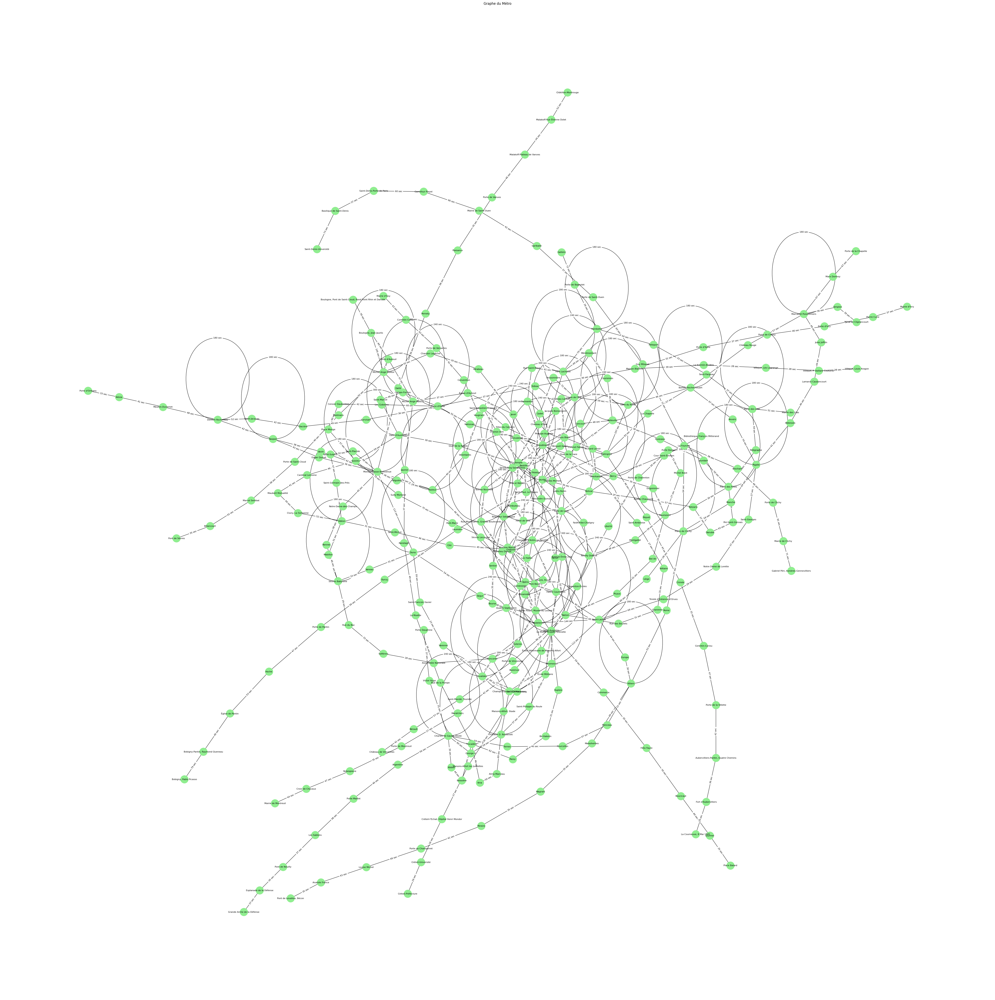

In [2]:
from entity.Graphe import Graphe
from service.draw_graph import afficher_graphe

graphe = Graphe()
graphe.ajouter_sommets(sommets)
graphe.ajouter_aretes(aretes)

afficher_graphe(graphe)

# ___Le travail à faire___

## Connexité
#### Pour montrer qu’un graphe est connexe, il faut prouver qu’il existe un chemin entre chaque paire de sommets dans le graphe pour cela on peut faire parcourir le graphe via DFS ou BFS car si tous les sommets ont été atteints à partir d’un seul sommet de départ, le graphe est connexe.

### BFS (Breadth-First Search)

In [3]:
from service.algorithme import bfs

sizeOfList = len(sommets)
vlf_aragon = graphe.get_sommet_by_name("Villejuif, Louis Aragon")
bfslist = bfs(graphe, vlf_aragon)
sizeOfBFSList = len(bfslist)

print("BFS")
#print("\n\tListe des sommets atteignable via Villejuif louis aragon : ", bfslist)
print("Nb sommet :",sizeOfList," Nb sommet atteignable : ",sizeOfBFSList)
print("Via BFS Le graphe ", "est connexe." if sizeOfList == sizeOfBFSList else "n'est pas connexe.")

BFS
Nb sommet : 296  Nb sommet atteignable :  296
Via BFS Le graphe  est connexe.


### Depth-First Search (DFS)


In [4]:
from service.algorithme import dfs

sizeOfList = len(sommets)
vlf_aragon = graphe.get_sommet_by_name("Villejuif, Louis Aragon")

dfs_list = dfs(graphe,vlf_aragon)
sizeOfDFSList = len(dfs_list)

print("DFS")
#print("\n\tListe des sommets atteignable via Villejuif louis aragon : ", dfs_list)
print("Nb sommet :",sizeOfList," Nb sommet atteignable : ",sizeOfDFSList)
print("Via DFS Le graphe ", "est connexe." if sizeOfList == sizeOfDFSList else "n'est pas connexe.")

DFS
Nb sommet : 296  Nb sommet atteignable :  296
Via DFS Le graphe  est connexe.


## Le plus court chemin

### Algorithme Bellman-Ford 

In [5]:
from entity.Graphe import Graphe
from service.algorithme import bellman_ford, chemin_le_plus_court

carrefour_pleyel = "Carrefour Pleyel"
start_sommet = graphe.get_sommet_by_name(carrefour_pleyel)

vlf_pvc = "Villejuif, P. Vaillant Couturier"
sommet_end = graphe.get_sommet_by_name(vlf_pvc)

chemin, temps = chemin_le_plus_court(graphe, start_sommet.stations[0], sommet_end.stations[0])

print("\nBellman Ford")
print("Vous êtes aux :", carrefour_pleyel)
for	num_station, sommet in chemin:
	station = sommet.get_station(num_station)

	print("ligne : ", station.numero_ligne, end=" ")
	if station.branchement != 0:
		print("branchement : ", station.branchement, end="")
	print("\n   ", sommet.nom_sommet)
	
time_minutes = int(temps / 60)

print("Vous êtes à :", vlf_pvc, "en", time_minutes, "minutes")



Bellman Ford
Vous êtes aux : Carrefour Pleyel
ligne :  13 branchement :  1
    Mairie de Saint-Ouen
ligne :  13 branchement :  1
    Garibaldi
ligne :  13 branchement :  1
    Porte de Saint-Ouen
ligne :  13 branchement :  1
    Guy Môquet
ligne :  13 
    La Fourche
ligne :  13 
    Place de Clichy
ligne :  13 
    Liège
ligne :  13 
    Saint-Lazare
ligne :  13 
    Miromesnil
ligne :  13 
    Champs Élysées, Clémenceau
ligne :  1 
    Champs Élysées, Clémenceau
ligne :  1 
    Concorde
ligne :  1 
    Tuileries
ligne :  1 
    Palais Royal, Musée du Louvre
ligne :  7 
    Palais Royal, Musée du Louvre
ligne :  7 
    Pont-Neuf
ligne :  7 
    Châtelet
ligne :  7 
    Pont-Marie
ligne :  7 
    Sully Morland
ligne :  7 
    Jussieu
ligne :  7 
    Place Monge
ligne :  7 
    Censier Daubenton
ligne :  7 
    Les Gobelins
ligne :  7 
    Place d'Italie
ligne :  7 
    Tolbiac
ligne :  7 
    Maison Blanche
ligne :  7 branchement :  2
    Le Kremlin-Bicêtre
ligne :  7 branchement :  

### Arbre couvrant de poids minimum (ACPM) avec Prim.

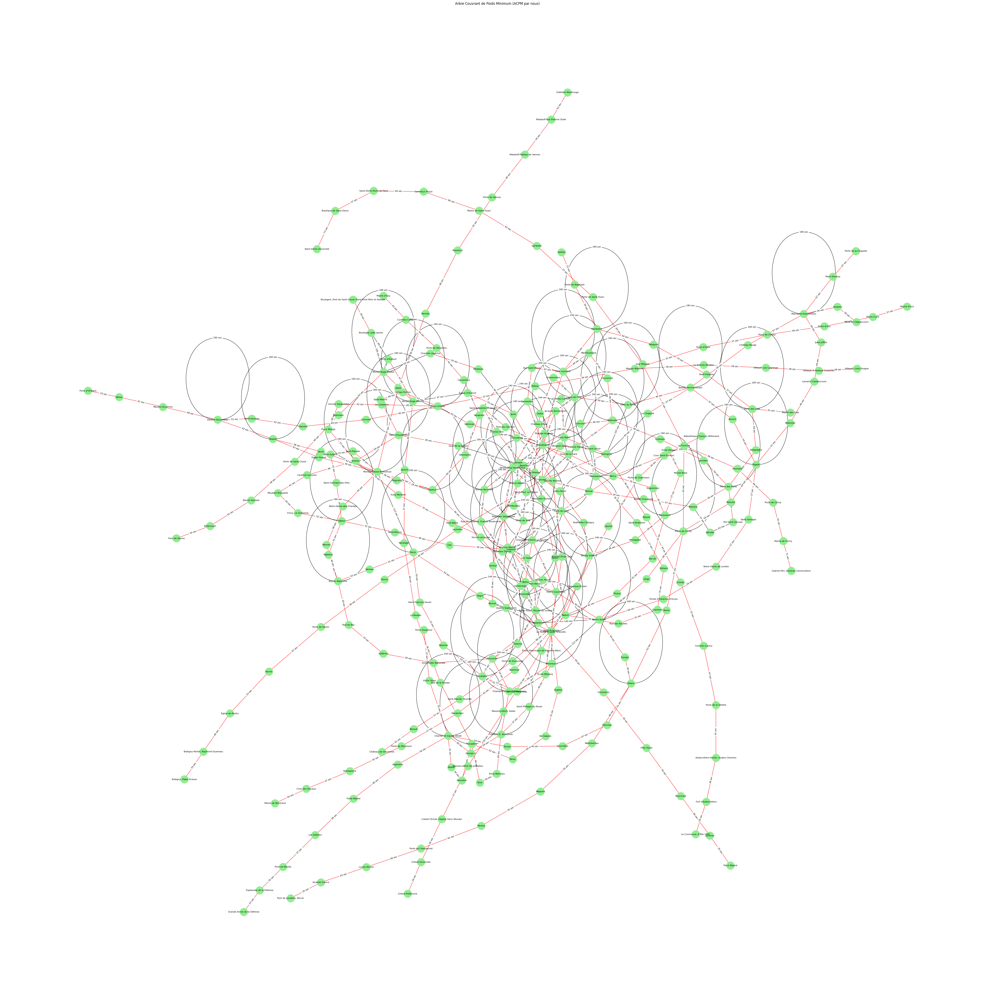

Graph with 296 nodes and 339 edges


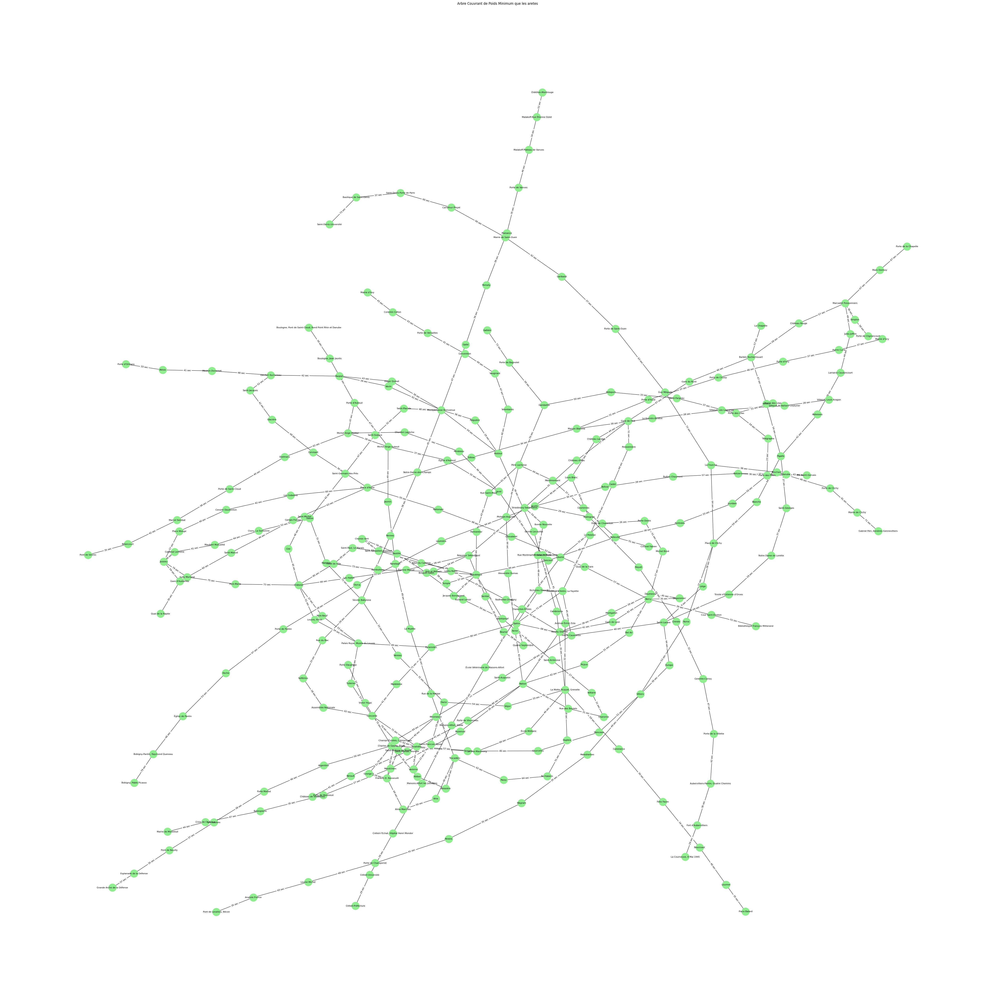

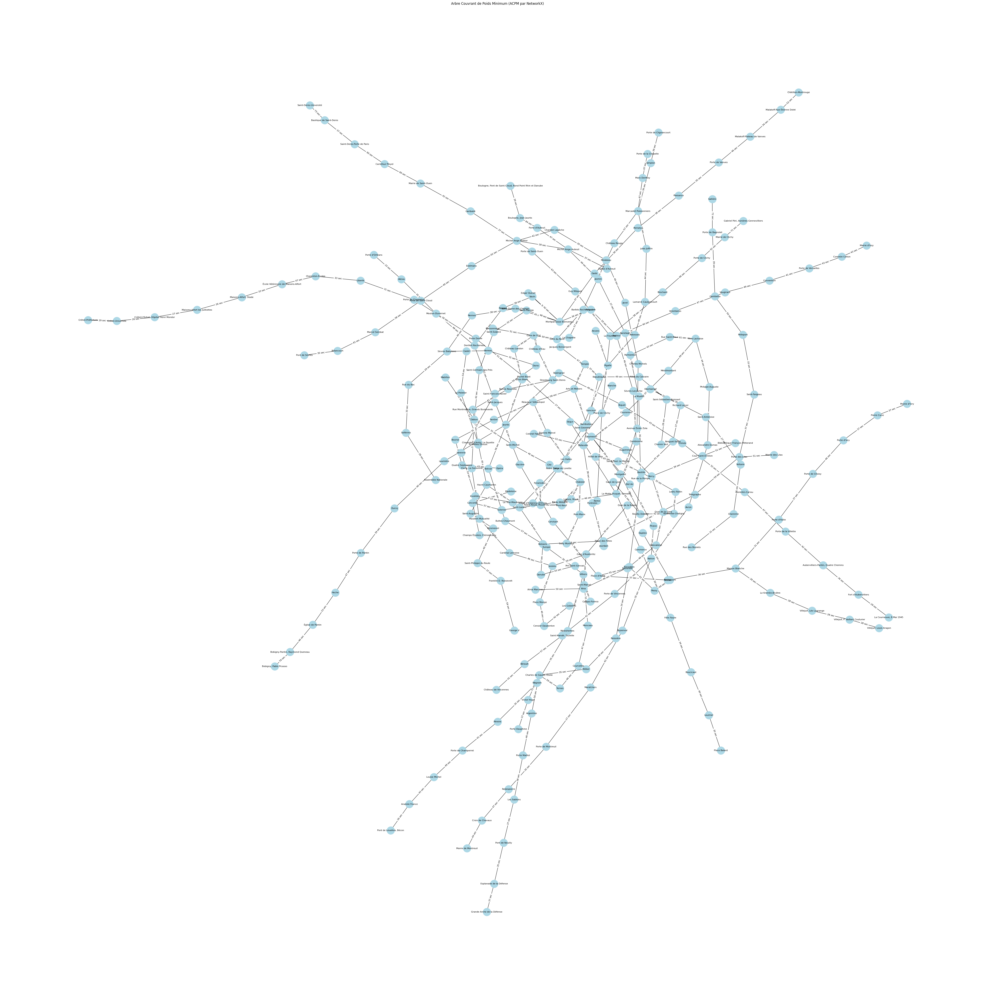

In [6]:
from entity.Graphe import Graphe
from service.algorithme import prim
from service.draw_graph import afficher_acpm, afficher_acpm_networkx


arete_minimal = prim(graphe)

afficher_acpm(graphe, arete_minimal)

graphe2 = Graphe()
graphe2.ajouter_sommets(sommets)
graphe2.ajouter_aretes(arete_minimal)

afficher_graphe(graphe2, "Arbre Couvrant de Poids Minimum que les aretes")
afficher_acpm_networkx(graphe)